In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [8]:
df = pd.read_csv("/Users/zy/Documents/GitHub/League-of-Legends/high_diamond_ranked_10min.csv")

In [9]:
df.head()

,gameId,blueWins,blueWardsPlaced,blueWardsDestroyed,blueFirstBlood,blueKills,blueDeaths,blueAssists,blueEliteMonsters,blueDragons,...,redTowersDestroyed,redTotalGold,redAvgLevel,redTotalExperience,redTotalMinionsKilled,redTotalJungleMinionsKilled,redGoldDiff,redExperienceDiff,redCSPerMin,redGoldPerMin
0,4519157822,0,28,2,1,9,6,11,0,0,...,0,16567,6.8,17047,197,55,-643,8,19.7,1656.7
1,4523371949,0,12,1,0,5,5,5,0,0,...,1,17620,6.8,17438,240,52,2908,1173,24.0,1762.0
2,4521474530,0,15,0,0,7,11,4,1,1,...,0,17285,6.8,17254,203,28,1172,1033,20.3,1728.5
3,4524384067,0,43,1,0,4,5,5,1,0,...,0,16478,7.0,17961,235,47,1321,7,23.5,1647.8
4,4436033771,0,75,4,0,6,6,6,0,0,...,0,17404,7.0,18313,225,67,1004,-230,22.5,1740.4


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9879 entries, 0 to 9878
Data columns (total 40 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   gameId                        9879 non-null   int64  
 1   blueWins                      9879 non-null   int64  
 2   blueWardsPlaced               9879 non-null   int64  
 3   blueWardsDestroyed            9879 non-null   int64  
 4   blueFirstBlood                9879 non-null   int64  
 5   blueKills                     9879 non-null   int64  
 6   blueDeaths                    9879 non-null   int64  
 7   blueAssists                   9879 non-null   int64  
 8   blueEliteMonsters             9879 non-null   int64  
 9   blueDragons                   9879 non-null   int64  
 10  blueHeralds                   9879 non-null   int64  
 11  blueTowersDestroyed           9879 non-null   int64  
 12  blueTotalGold                 9879 non-null   int64  
 13  blu

In [11]:
print(df.columns)


Index(['gameId', 'blueWins', 'blueWardsPlaced', 'blueWardsDestroyed',
       'blueFirstBlood', 'blueKills', 'blueDeaths', 'blueAssists',
       'blueEliteMonsters', 'blueDragons', 'blueHeralds',
       'blueTowersDestroyed', 'blueTotalGold', 'blueAvgLevel',
       'blueTotalExperience', 'blueTotalMinionsKilled',
       'blueTotalJungleMinionsKilled', 'blueGoldDiff', 'blueExperienceDiff',
       'blueCSPerMin', 'blueGoldPerMin', 'redWardsPlaced', 'redWardsDestroyed',
       'redFirstBlood', 'redKills', 'redDeaths', 'redAssists',
       'redEliteMonsters', 'redDragons', 'redHeralds', 'redTowersDestroyed',
       'redTotalGold', 'redAvgLevel', 'redTotalExperience',
       'redTotalMinionsKilled', 'redTotalJungleMinionsKilled', 'redGoldDiff',
       'redExperienceDiff', 'redCSPerMin', 'redGoldPerMin'],
      dtype='object')


There are no null/ missing values to be removed

### **EDA**

In [12]:
df1 = df.copy()

Check relationships of Blue Team's features

In [13]:
cols = ['gameId', 'redFirstBlood', 'redKills','redDeaths',
        'redGoldDiff', 'redExperienceDiff']
df1 = df1.drop(cols, axis = 1)

In [14]:
print(df1.columns)

Index(['blueWins', 'blueWardsPlaced', 'blueWardsDestroyed', 'blueFirstBlood',
       'blueKills', 'blueDeaths', 'blueAssists', 'blueEliteMonsters',
       'blueDragons', 'blueHeralds', 'blueTowersDestroyed', 'blueTotalGold',
       'blueAvgLevel', 'blueTotalExperience', 'blueTotalMinionsKilled',
       'blueTotalJungleMinionsKilled', 'blueGoldDiff', 'blueExperienceDiff',
       'blueCSPerMin', 'blueGoldPerMin', 'redWardsPlaced', 'redWardsDestroyed',
       'redAssists', 'redEliteMonsters', 'redDragons', 'redHeralds',
       'redTowersDestroyed', 'redTotalGold', 'redAvgLevel',
       'redTotalExperience', 'redTotalMinionsKilled',
       'redTotalJungleMinionsKilled', 'redCSPerMin', 'redGoldPerMin'],
      dtype='object')


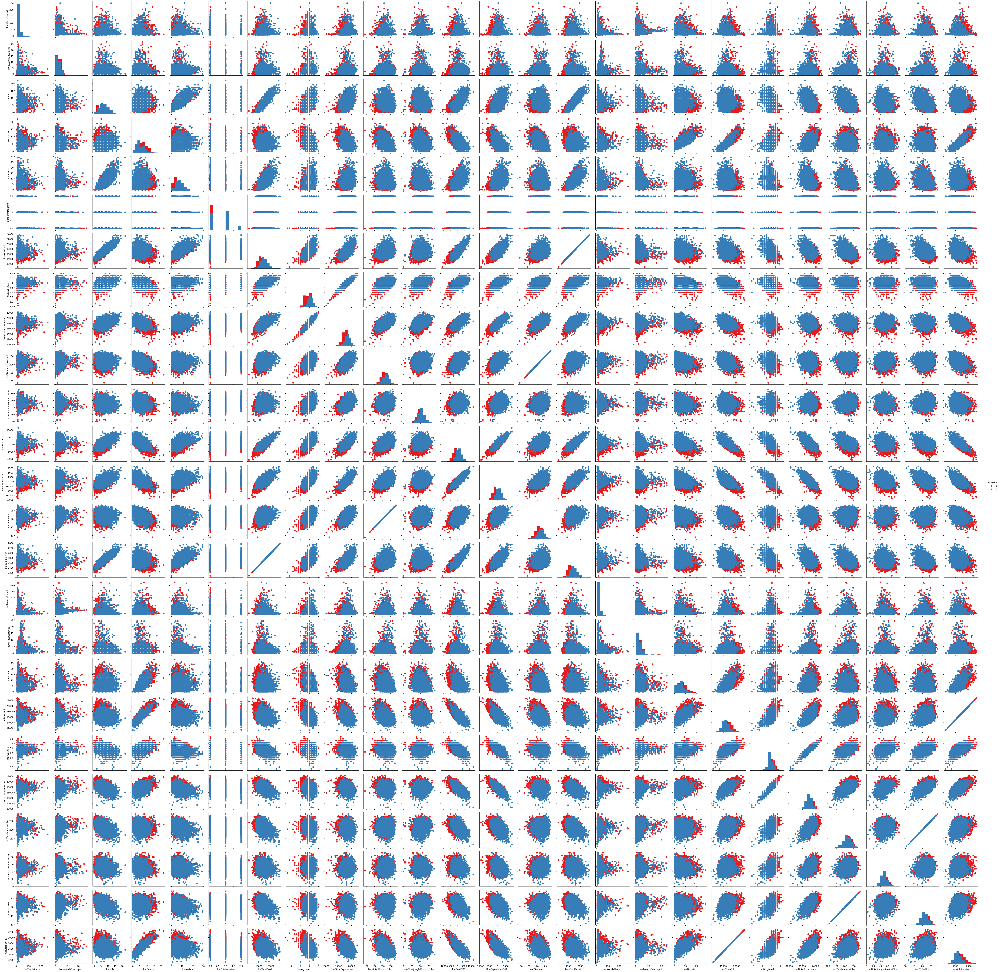

In [15]:
g = sns.PairGrid(data=df1, vars=['blueWardsPlaced', 'blueWardsDestroyed', 
       'blueKills', 'blueDeaths', 'blueAssists', 'blueEliteMonsters',
       'blueTotalGold',
       'blueAvgLevel', 'blueTotalExperience', 'blueTotalMinionsKilled',
       'blueTotalJungleMinionsKilled', 'blueGoldDiff', 'blueExperienceDiff',
       'blueCSPerMin', 'blueGoldPerMin', 'redWardsPlaced', 'redWardsDestroyed',
       'redAssists', 'redTotalGold', 'redAvgLevel',
       'redTotalExperience', 'redTotalMinionsKilled',
       'redTotalJungleMinionsKilled', 'redCSPerMin', 'redGoldPerMin'], hue='blueWins', palette='Set1')
g.map_diag(plt.hist)
g.map_offdiag(plt.scatter)
g.add_legend();

Check Collinearity of Blue Team features

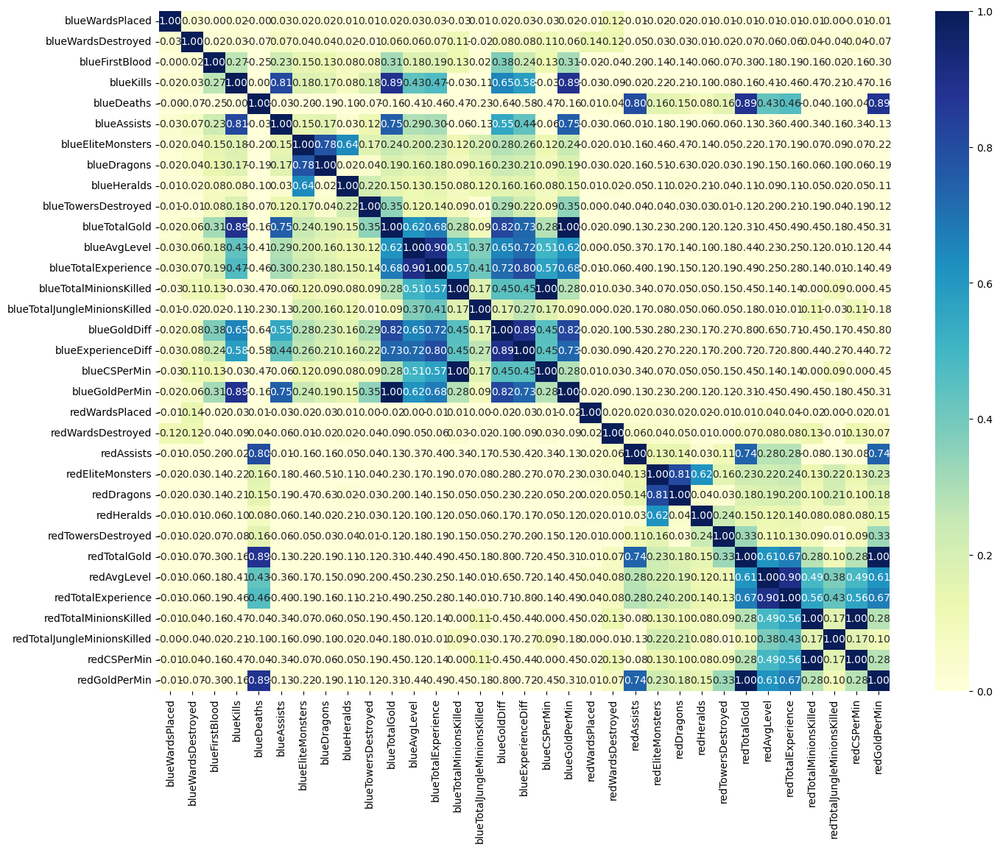

In [16]:
plt.figure(figsize=(16, 12))
sns.heatmap(df1.drop('blueWins', axis=1).corr(), cmap='YlGnBu', annot=True, fmt='.2f', vmin=0);

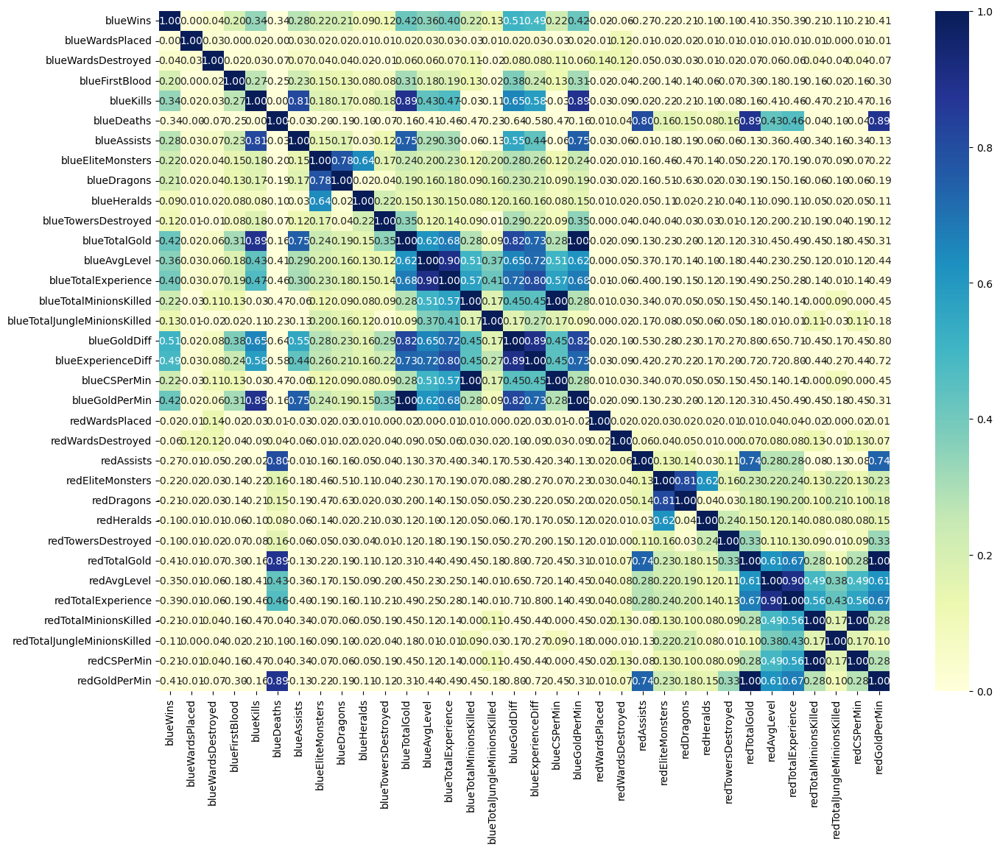

In [17]:
plt.figure(figsize=(16, 12))
sns.heatmap(df1.corr(), cmap='YlGnBu', annot=True, fmt='.2f', vmin=0);

Clean the dataset based on the collinearity

In [18]:
corr = df1.corr()
high_corr_columns = []

for i, column in enumerate(corr.columns):
    for j, row in enumerate(corr.columns):
        if i < j and abs(corr.at[row, column]) >= 0.8:
            high_corr_columns.append((column, row))

print(high_corr_columns)

[('blueKills', 'blueAssists'), ('blueKills', 'blueTotalGold'), ('blueKills', 'blueGoldPerMin'), ('blueDeaths', 'redAssists'), ('blueDeaths', 'redTotalGold'), ('blueDeaths', 'redGoldPerMin'), ('blueTotalGold', 'blueGoldDiff'), ('blueTotalGold', 'blueGoldPerMin'), ('blueAvgLevel', 'blueTotalExperience'), ('blueTotalExperience', 'blueExperienceDiff'), ('blueTotalMinionsKilled', 'blueCSPerMin'), ('blueGoldDiff', 'blueExperienceDiff'), ('blueGoldDiff', 'blueGoldPerMin'), ('blueGoldDiff', 'redTotalGold'), ('blueGoldDiff', 'redGoldPerMin'), ('blueExperienceDiff', 'redTotalExperience'), ('redEliteMonsters', 'redDragons'), ('redTotalGold', 'redGoldPerMin'), ('redAvgLevel', 'redTotalExperience'), ('redTotalMinionsKilled', 'redCSPerMin')]


In [19]:
cols = ['blueWins', 'blueWardsPlaced', 'blueWardsDestroyed', 'blueFirstBlood', 'blueAssists', 'blueEliteMonsters'
        , 'blueHeralds', 'blueTowersDestroyed', 'blueTotalExperience', 'blueTotalJungleMinionsKilled',
'blueCSPerMin', 'blueGoldPerMin', 'redWardsPlaced', 'redWardsDestroyed',
'redAssists', 'redEliteMonsters', 'redHeralds',
'redTowersDestroyed', 'redTotalExperience', 'redTotalJungleMinionsKilled', 'redCSPerMin', 'redGoldPerMin']
df1 = df1[cols]

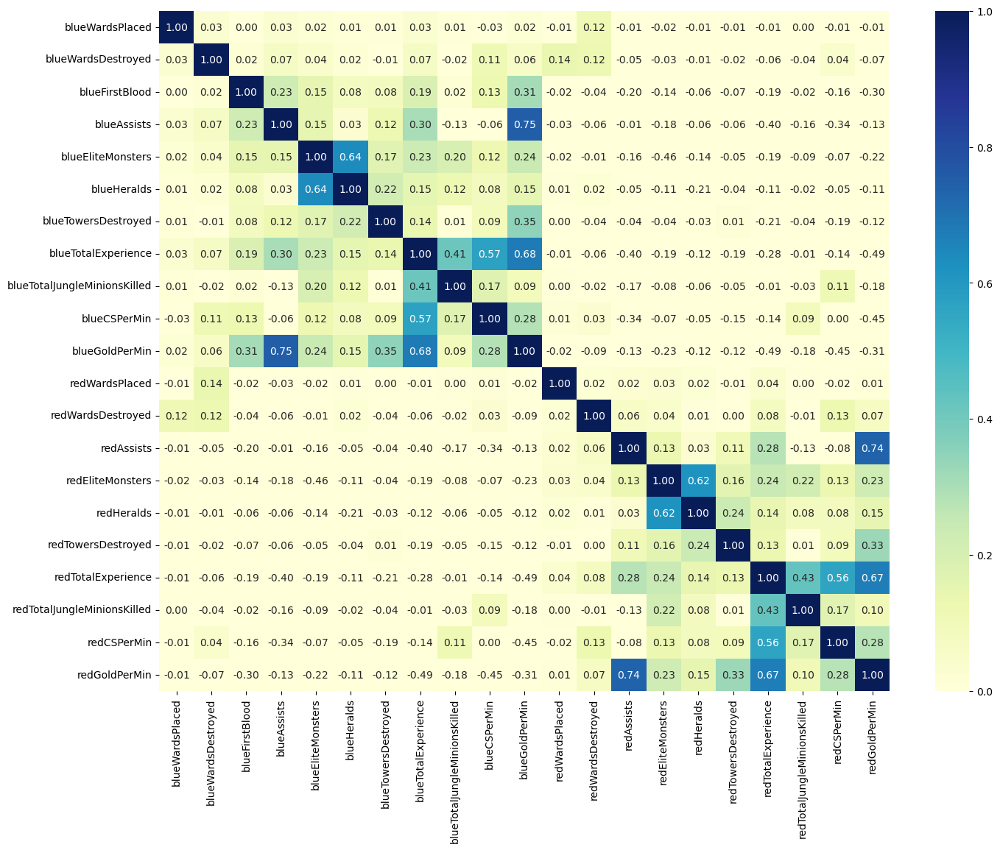

In [20]:
plt.figure(figsize=(16, 12))
sns.heatmap(df1.drop('blueWins', axis=1).corr(), cmap='YlGnBu', annot=True, fmt='.2f', vmin=0);

Create a histogram of of cleaned, new dataframe

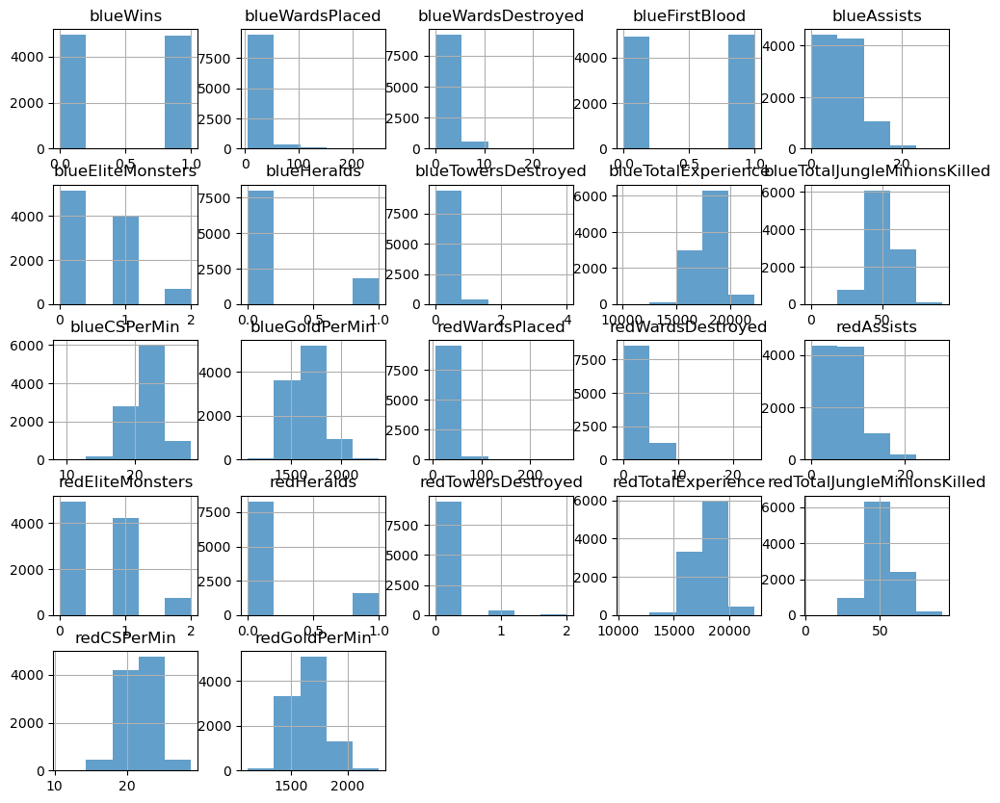

In [21]:
df1.hist(alpha = 0.7, figsize=(12,10), bins=5);

### **Feature Engineering**

In [22]:
df1['blueHelpful'] = np.where(df['blueKills'] != 0, df['blueAssists'] / df['blueKills'], 0)
df1['redHelpful'] = np.where(df['blueDeaths'] != 0, df['redAssists'] / df['blueDeaths'], 0)

df1['blueJunglePercentage'] = df['blueTotalJungleMinionsKilled'] / df['blueTotalMinionsKilled']
df1['redJunglePercentage'] = df['redTotalJungleMinionsKilled'] / df['redTotalMinionsKilled']

df1['redWardsRemaining'] = df['redWardsPlaced'] - df['blueWardsDestroyed']
df1['blueWardsRemaining'] = df['blueWardsPlaced'] - df['redWardsDestroyed']

/var/folders/sl/1mdv9dys2gs9j2lr3pw7f3sm0000gn/T/ipykernel_38975/506726123.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['blueHelpful'] = np.where(df['blueKills'] != 0, df['blueAssists'] / df['blueKills'], 0)
/var/folders/sl/1mdv9dys2gs9j2lr3pw7f3sm0000gn/T/ipykernel_38975/506726123.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['redHelpful'] = np.where(df['blueDeaths'] != 0, df['redAssists'] / df['blueDeaths'], 0)
/var/folders/sl/1mdv9dys2gs9j2lr3pw7f3sm0000gn/T/ipykernel_38975/506726123

### **Train Test Split**

In [23]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

X = df1.drop('blueWins', axis=1)
y = df1['blueWins']
scaler = MinMaxScaler()
scaler.fit(X)
X = scaler.transform(X)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [24]:
X.shape

(9879, 27)

### **Logistic Regression**

In [44]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report
from sklearn.linear_model import LogisticRegression

param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100], 
    'penalty': ['l1', 'l2'], 
    'solver': ['liblinear'],
}

log_reg = LogisticRegression()
grid_search = GridSearchCV(estimator=log_reg, param_grid=param_grid, cv=5, scoring='accuracy', verbose=1)

grid_search.fit(X_train, y_train)

print("Best parameters found: ", grid_search.best_params_)

best_model_log = grid_search.best_estimator_
y_pred = best_model_log.predict(X_test)

acc_reg = accuracy_score(y_test, y_pred)

print("Accuracy on test set: ", acc_reg)
print("Classification Report:\n", classification_report(y_test, y_pred))

Fitting 5 folds for each of 12 candidates, totalling 60 fits
Best parameters found:  {'C': 0.001, 'penalty': 'l1', 'solver': 'liblinear'}
Accuracy on test set:  0.7252024291497976
Classification Report:
               precision    recall  f1-score   support

           0       0.73      0.72      0.72       983
           1       0.72      0.74      0.73       993

    accuracy                           0.73      1976
   macro avg       0.73      0.73      0.73      1976
weighted avg       0.73      0.73      0.73      1976



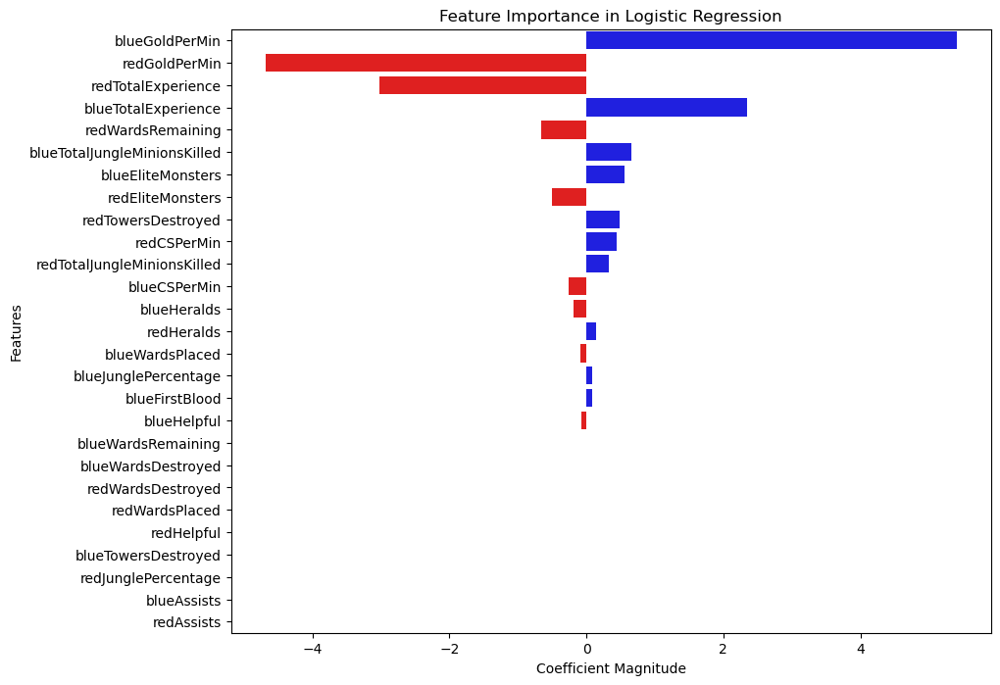

In [26]:
coefficients = best_model_log.coef_[0]
feature_names = df1.drop('blueWins', axis=1).columns
feature_importance = pd.Series(coefficients, index=feature_names).sort_values(key=abs, ascending=False)
plt.figure(figsize=(10, 8))
bar_colors = ['red' if x < 0 else 'blue' for x in feature_importance]
sns.barplot(x=feature_importance, y=feature_importance.index, palette=bar_colors)

plt.title('Feature Importance in Logistic Regression')
plt.xlabel('Coefficient Magnitude')
plt.ylabel('Features')
plt.show()

### **Random Forest**

In [27]:
# fit the decision tree model
from sklearn import tree

tree = tree.DecisionTreeClassifier()

# search the best params
grid = {'min_samples_split': [5, 10, 20, 50, 100]}

clf_tree = GridSearchCV(tree, grid, cv=5)
clf_tree.fit(X_train, y_train)

pred_tree = clf_tree.predict(X_test)

# get the accuracy score
acc_tree = accuracy_score(pred_tree, y_test)
print(acc_tree)

0.6867408906882592


In [28]:
feature_names = df1.columns
class_names = ['Lose', 'Win']

print("Feature names:", list(feature_names))
print("Class names:", list(class_names))

Feature names: ['blueWins', 'blueWardsPlaced', 'blueWardsDestroyed', 'blueFirstBlood', 'blueAssists', 'blueEliteMonsters', 'blueHeralds', 'blueTowersDestroyed', 'blueTotalExperience', 'blueTotalJungleMinionsKilled', 'blueCSPerMin', 'blueGoldPerMin', 'redWardsPlaced', 'redWardsDestroyed', 'redAssists', 'redEliteMonsters', 'redHeralds', 'redTowersDestroyed', 'redTotalExperience', 'redTotalJungleMinionsKilled', 'redCSPerMin', 'redGoldPerMin', 'blueHelpful', 'redHelpful', 'blueJunglePercentage', 'redJunglePercentage', 'redWardsRemaining', 'blueWardsRemaining']
Class names: ['Lose', 'Win']


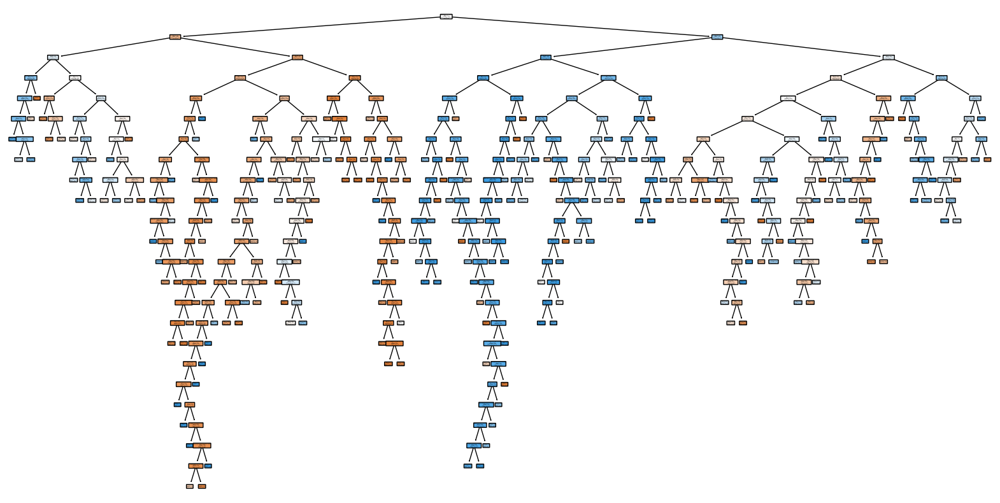

In [29]:
from sklearn.tree import plot_tree

# Extract the best estimator
best_tree = clf_tree.best_estimator_

# plot the best decision tree
plt.figure(figsize=(20,10))
plot_tree(best_tree, filled=True, rounded=True, feature_names=feature_names, class_names=class_names)
plt.show()

Simplify the Decision Tree

In [30]:
from sklearn import tree
tree1 = tree.DecisionTreeClassifier()

# search the best params
grid = {'min_samples_split': [5]}

clf_tree1 = GridSearchCV(tree1, grid, cv=5)
clf_tree1.fit(X_train, y_train)

pred_tree1 = clf_tree1.predict(X_test)

# get the accuracy score
acc_tree1 = accuracy_score(pred_tree, y_test)
print(acc_tree1)

0.6867408906882592


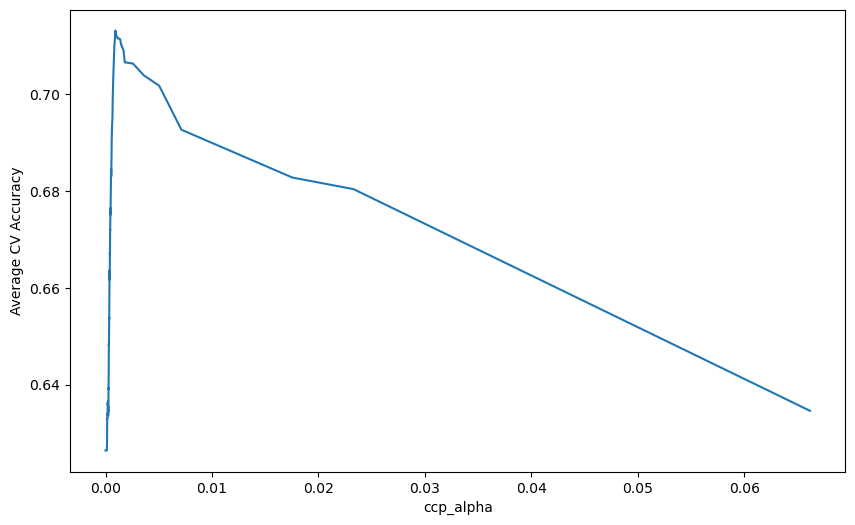

Optimal ccp_alpha: 0.0009295561515181294


DecisionTreeClassifier(ccp_alpha=0.0009295561515181294, random_state=42)

In [31]:
from sklearn.model_selection import cross_val_score
import numpy as np
from sklearn.tree import DecisionTreeClassifier

clf = tree.DecisionTreeClassifier(random_state=42)
path = clf.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

# Evaluate the effect of ccp_alpha on cross-validation accuracy
accuracy_scores = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
    scores = cross_val_score(clf, X_train, y_train, cv=5)
    accuracy_scores.append(np.mean(scores))

# Plot the accuracy scores against ccp_alpha values
plt.figure(figsize=(10, 6))
plt.plot(ccp_alphas, accuracy_scores)
plt.xlabel('ccp_alpha')
plt.ylabel('Average CV Accuracy')
plt.show()

# Select the ccp_alpha that maximizes accuracy
optimal_ccp_alpha = ccp_alphas[np.argmax(accuracy_scores)]
print('Optimal ccp_alpha:', optimal_ccp_alpha)

# Rebuild the tree using the optimal ccp_alpha
clf = DecisionTreeClassifier(random_state=42, ccp_alpha=optimal_ccp_alpha)
clf.fit(X_train, y_train)


In [32]:
clf = DecisionTreeClassifier(random_state=42, ccp_alpha=optimal_ccp_alpha)
clf.fit(X_train, y_train)

pred_tree2 = clf.predict(X_test)

# get the accuracy score
acc_tree2 = accuracy_score(pred_tree2, y_test)
print(acc_tree2)

0.7100202429149798


### **Random Forest**

In [33]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier()

# search the best params
grid = {'n_estimators':[100,200,300,400,500], 'max_depth': [2, 5, 10]}

clf_rf = GridSearchCV(rf, grid, cv=5)
clf_rf.fit(X_train, y_train)

pred_rf = clf_rf.predict(X_test)
# get the accuracy score
acc_rf = accuracy_score(pred_rf, y_test)
print(acc_rf)

0.7201417004048583


In [34]:
from sklearn.metrics import confusion_matrix

# Generate the confusion matrix
conf_matrix = confusion_matrix(y_test, pred_rf)

# Print the confusion matrix
print(conf_matrix)

[[712 271]
 [282 711]]


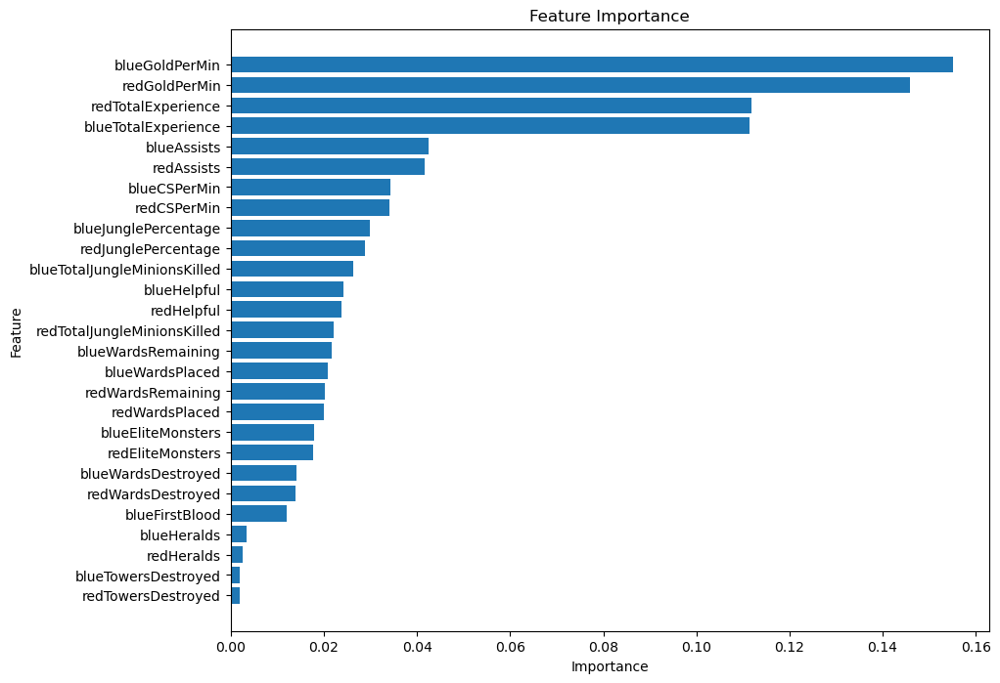

In [35]:
best_rf = clf_rf.best_estimator_

feature_importances = best_rf.feature_importances_
feature_names = df1.drop('blueWins', axis=1).columns.tolist()

features_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importances
})

# Sort the DataFrame by the importances to make the plot more informative
features_df = features_df.sort_values(by='Importance', ascending=True)

# Plotting
plt.figure(figsize=(10, 8))
plt.barh(features_df['Feature'], features_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance')
plt.show()

### **PCA**

In [36]:

X = df1.drop('blueWins', axis=1)
y = df1['blueWins']
# PCA is affected by scale, scale the dataset first
from sklearn import preprocessing
# Standardizing the features
X = preprocessing.StandardScaler().fit_transform(X)

In [37]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
components = pca.fit_transform(X)
print(pca.explained_variance_ratio_)

[0.15886935 0.08606997]


In [38]:
# create visulization df

df_vis = pd.DataFrame(data = components, columns = ['pc1', 'pc2'])
df_vis = pd.concat([df_vis, df1['blueWins']], axis = 1)
X = df_vis[['pc1', 'pc2']]
y = df_vis['blueWins']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [39]:
# refit the pca data into random forest
clf_rf.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'max_depth': [2, 5, 10],
                         'n_estimators': [100, 200, 300, 400, 500]})

In [40]:
# visualize function
from matplotlib.colors import ListedColormap
def DecisionBoundary(clf):
    X = df_vis[['pc1', 'pc2']]
    y = df_vis['blueWins']

    h = .02  # step size in the mesh

    # Create color maps
    cmap_light = ListedColormap(['#FFAAAA', '#AAAAFF'])
    cmap_bold = ListedColormap(['#FF0000', '#0000FF'])

#Plot the decision boundary. For that, we will assign a color to each
    # point in the mesh [x_min, x_max]x[y_min, y_max].
    x_min, x_max = X.iloc[:, 0].min() - 1, X.iloc[:, 0].max() + 1
    y_min, y_max = X.iloc[:, 1].min() - 1, X.iloc[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    plt.figure(figsize=(8, 8))
    plt.pcolormesh(xx, yy, Z, cmap=cmap_light)

    # Plot also the training points
    plt.scatter(X.iloc[:, 0], X.iloc[:, 1], c=y, cmap=cmap_bold)
    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())
    plt.show()

/Users/zy/anaconda3/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


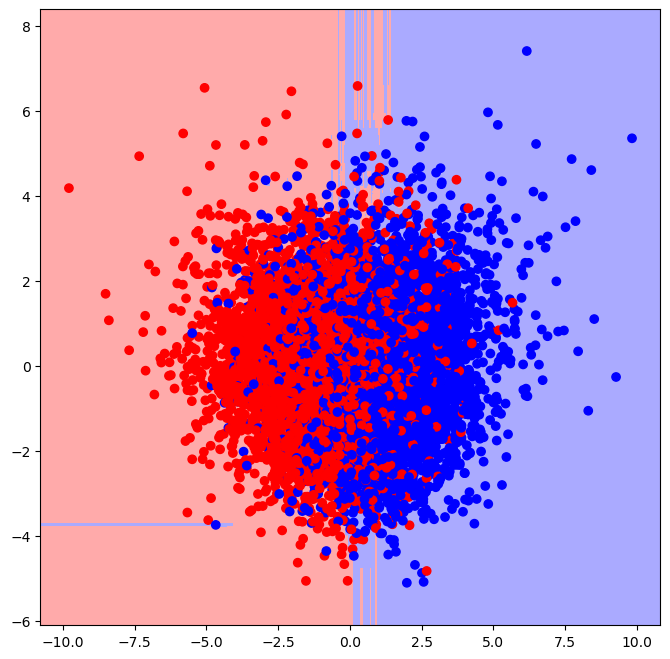

In [41]:
DecisionBoundary(clf_rf)

### **LightGBM** 

In [42]:
import lightgbm as lgb

param_grid = {
    'num_leaves': [31, 50, 100], 
    'learning_rate': [0.01, 0.1, 0.5], 
    'n_estimators': [100, 200, 500],
    'max_depth': [-1, 5, 10],
}

lgbm = lgb.LGBMClassifier(boosting_type='gbdt', objective='binary', random_state=42)

grid_search = GridSearchCV(estimator=lgbm, param_grid=param_grid, cv=5, scoring='accuracy', verbose=1, n_jobs=-1)

grid_search.fit(X_train, y_train)

print("Best parameters found: ", grid_search.best_params_)

best_model_gbm = grid_search.best_estimator_
y_pred = best_model_gbm.predict(X_test)

acc_gbm = accuracy_score(y_test, y_pred)

print("Accuracy on test set: ", acc_gbm)
print("Classification Report:\n", classification_report(y_test, y_pred))

Fitting 5 folds for each of 81 candidates, totalling 405 fits
[LightGBM] [Info] Number of positive: 3149, number of negative: 3173
[LightGBM] [Info] Number of positive: 3149, number of negative: 3173
[LightGBM] [Info] Number of positive: 3150, number of negative: 3172
[LightGBM] [Info] Number of positive: 3150, number of negative: 3173
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006401 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006647 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006603 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of tes

### **XGBoost** 

In [46]:
import xgboost as xgb

param_grid = {
    'max_depth': [3, 6, 10], 
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [100, 200, 300],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
}

xgb_clf = xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss')

grid_search = GridSearchCV(xgb_clf, param_grid, cv=5, scoring='accuracy', verbose=1, n_jobs=-1)

grid_search.fit(X_train, y_train)

print("Best parameters found: ", grid_search.best_params_)

best_model_xgb = grid_search.best_estimator_
y_pred = best_model_xgb.predict(X_test)

acc_xgb = accuracy_score(y_test, y_pred)

print("Accuracy on test set: ", acc_xgb)
print("Classification Report:\n", classification_report(y_test, y_pred))

Fitting 5 folds for each of 108 candidates, totalling 540 fits
Best parameters found:  {'colsample_bytree': 1.0, 'learning_rate': 0.01, 'max_depth': 6, 'n_estimators': 200, 'subsample': 0.8}
Accuracy on test set:  0.7176113360323887
Classification Report:
               precision    recall  f1-score   support

           0       0.72      0.71      0.71       983
           1       0.72      0.73      0.72       993

    accuracy                           0.72      1976
   macro avg       0.72      0.72      0.72      1976
weighted avg       0.72      0.72      0.72      1976



### **GradientBoostingClassifier**

In [47]:
from sklearn.ensemble import GradientBoostingClassifier

param_grid = {
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [100, 200, 300], 
    'max_depth': [3, 5, 7], 
    'min_samples_split': [2, 4],  
    'min_samples_leaf': [1, 2],
}
gb_clf = GradientBoostingClassifier(random_state=42)
grid_search = GridSearchCV(estimator=gb_clf, param_grid=param_grid, cv=5, scoring='accuracy', verbose=1, n_jobs=-1)
grid_search.fit(X_train, y_train)

print("Best parameters found: ", grid_search.best_params_)

best_model_gb = grid_search.best_estimator_
y_pred = best_model_gb.predict(X_test)

acc_gb = accuracy_score(y_test, y_pred)

print("Accuracy on test set: ", acc_gb)
print("Classification Report:\n", classification_report(y_test, y_pred))

Fitting 5 folds for each of 108 candidates, totalling 540 fits
Best parameters found:  {'learning_rate': 0.01, 'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Accuracy on test set:  0.7257085020242915
Classification Report:
               precision    recall  f1-score   support

           0       0.74      0.69      0.71       983
           1       0.71      0.77      0.74       993

    accuracy                           0.73      1976
   macro avg       0.73      0.73      0.73      1976
weighted avg       0.73      0.73      0.73      1976



## Model Performance Comparison

In [48]:
# Define the model names and their corresponding accuracy scores or other performance metrics
model_names = ['Logistic Regression', 'Decision Tree', 'Decision Tree (Simplified)', 'Decision Tree (Optimized)', 'Random Forest', 
               'LightGBM', 'XGBoost', 'Gradient Boosting']
accuracy_scores = [acc_reg, acc_tree, acc_tree1, acc_tree2, 
                   acc_rf, acc_gbm, acc_xgb, acc_gb]

# Create a DataFrame to store the model names and accuracy scores
performance_df = pd.DataFrame({'Model': model_names, 'Accuracy Score': accuracy_scores})

# Display the DataFrame
print(performance_df)

                        Model  Accuracy Score
0         Logistic Regression        0.725202
1               Decision Tree        0.686741
2  Decision Tree (Simplified)        0.686741
3   Decision Tree (Optimized)        0.710020
4               Random Forest        0.720142
5                    LightGBM        0.721154
6                     XGBoost        0.717611
7           Gradient Boosting        0.725709
